![WEkEO by Copernicus and Partners](./img/WEkEO_banner_partners.png)

# WEKEO HYDROLOGY TRAINING

<div style="text-align: right"><i>  </i></div>

***
<center><h1> Natural Disasters: Monitoring the Boris Storm </h1></center>

***
**General Note 1**: Execute each cell through the <button class="btn btn-default btn-xs"><i class="icon-play fa fa-play"></i></button> button from the top MENU (or keyboard shortcut `Shift` + `Enter`).<br>
<br>
**General Note 2**: If, for any reason, the kernel is not working anymore, in the top MENU, click on the <button class="btn btn-default btn-xs"><i class="fa fa-repeat icon-repeat"></i></button> button. Then, in the top MENU, click on "Run" and select "Run All Above Selected Cell".<br>

**General Note 3**: To explore more (Python and R) content, there is our [**Jupyter Catalogue**](https://notebooks.apps.mercator.dpi.wekeo.eu/), and if you seek support, there are plenty of useful resources in our [**Help Center**](https://help.wekeo.eu/en/). Feel free to contact us using our [**live chat widget**](https://www.wekeo.eu/support) or by email at at [support@wekeo.eu](support@wekeo.eu) ! <br>

***

**PREREQUISITES**

This notebook has the following prerequisites:
- [A WEkEO account](https://my.wekeo.eu/user-registration) if you are using or plan to use WEkEO.

**LEARNING OUTCOMES**

At the end of this notebook you will know: 

- How to use the WEkEO HDA client to programmatically fetch large-scale datasets.
- How to use xarray and pandas to manipulate multidimensional NetCDF files, including spatial slicing and temporal resampling.
- How to synchronize precipitation and flood indicators to track the spatiotemporal propagation of a flood wave.
- How to create static and animated maps using Cartopy and Matplotlib to communicate the scale and movement of natural disasters.

# Table of contents

- [1. Introduction](#1.-Introduction)
- [2. Setting up the Python environment](#2.-Setting-up-the-Python-environment)
    - [2.1 Required Python modules](#2.1-Required-Python-modules)
    - [2.2 Setup the WEkEO HDA and Credentials](#2.2-Setup-the-WEkEO-HDA-and-Credentials)
- [3. Data Download](#3.-Data-Download)
    - [3.1. Presentation of the product used](#3.1.-Presentation-of-the-product-used)
    - [3.2. Downloading the product](#3.2.-Downloading-the-product)
- [4. Exploring the dataset](#4.-Exploring-the-dataset)
- [5. Finding the storm](#5.-Finding-the-storm)
- [6. The chronology of the flooding](#6.-The-chronology-of-the-flooding)
    - [6.1 First look at the Soil Water Index data](#6.1-First-look-at-the-Soil-Water-Index-data)
    - [6.2 Reconstructing the timeline](#6.2-Reconstructing-the-timeline)
- [7. Animating the flood](#7.-Animating-the-flood)
  - [7.1 Filtering the data with the upstream area](#7.1-Filtering-the-data-with-the-upstream-area)
  - [7.2 Creating the final animation](#7.2-Creating-the-final-animation)
- [8. Take home messages](#8.-Take-home-messages)


## 1. Introduction

[Go back to the "Table of contents"](#Table-of-contents)


Natural disasters - ranging from wildfires and droughts to catastrophic floods - represent some of the most significant threats to human life, infrastructure, and global ecosystems. As the Earth's climate warms, the frequency and intensity of extreme weather events are increasing. Among these, hydrological hazards are particularly complex; they are driven by a delicate balance between atmospheric conditions, land use, and soil characteristics. Effective disaster management and risk reduction now rely heavily on Earth Observation (EO) data, which provides the critical insights needed to monitor these events in real-time, understand their underlying mechanisms, and improve future predictive models.

In September 2024, Central Europe was hit by Storm Boris, a slow-moving V-b track depression that triggered one of the most devastating flooding events of the 21st century. Trapped between two high-pressure systems, Boris remained stationary over Austria, the Czech Republic, and Poland for several days, delivering upwards of four months' worth of rain in less than a week.

The consequences were catastrophic, particularly within the Oder River basin. The sheer volume of water overwhelmed infrastructure, leading to record-breaking river levels. Understanding the mechanics of such a disaster requires more than just looking at rain gauges; it requires a holistic view of the "water journey"—from the atmosphere to the soil and, ultimately, into the river networks.


| <img src="img/Czech_Republic_Floods_86612.avif" width="800"> | 
|:--:| 
| A drone image showing the floods in the Ostrava-Koblov district, Czech Republic, Sunday Sept. 15, 2024. From [The Independent](https://www.independent.co.uk/news/world/europe/flooding-poland-germany-europe-flood-b2613578.html). |


In this notebook, we will use data retrieved from the Global Flood Awareness System (GloFAS) and ERA5, all available in the WEkEO catalogue, to reconstruct the event's timeline with scientific precision.


## 2. Prepare your environment
[Go back to the "Table of contents"](#Table-of-contents)

### 2.1 Required Python modules
[Go back to the "Table of contents"](#Table-of-contents)

The Jupyter Notebook must be set up with all the necessary available tools from the Jupyter Notebook ecosystem. Here is the list of the modules we will be using in this exercise.

| Module name | Description |
| :---: | :---|
| **numpy** | [NumPy](https://numpy.org/) is the fundamental package for scientific computing with Python and for managing ND-arrays. |
| **xarray** | [Xarray](http://xarray.pydata.org/en/stable/) is a very user friendly library to manipulate NetCDF files within Python. It introduces labels in the form of dimensions, coordinates and attributes on top of raw NumPy-like arrays, which allows for a more intuitive, more concise, and less error-prone developer experience. |
| **matplotlib** |[Matplotlib](https://matplotlib.org/) is a Python 2D plotting library which produces high quality figures. |
| **cartopy** |[Cartopy](https://scitools.org.uk/cartopy/docs/latest/) is a library for plotting maps and geospatial data analyses in Python. |
|**geopandas**|[Geopandas](https://geopandas.org/en/stable/) is a library that allows spatial operation on geometric data.|
|**rasterio**|[Rasterio](https://rasterio.readthedocs.io/en/stable/) is a powerful tool for reading, writing, analyzing, and manipulating geospatial raster data, leveraging Python's capabilities and supporting formats like GeoTIFF with ease.|

In [22]:
# Modules system
import warnings

warnings.filterwarnings("ignore")
import getpass
import hda
import json
from pathlib import Path

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
import matplotlib.animation as animation
import matplotlib.pyplot as plt
# Modules related to plot and EO data manipulation
import numpy as np
import xarray as xr
# Modules related to data retrieving
from hda import Client
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

### 2.2 Setup the WEkEO HDA and Credentials

[Go back to the "Table of contents"](#Table-of-contents)

To download Copernicus marine products from the [WEkEO Data Catalogue](https://wekeo.copernicus.eu/data?view=catalogue), we will use the WEkEO [Harmonised Data Access (HDA) adaptor](https://help.wekeo.eu/en/articles/9515753-what-is-the-harmonized-data-access-hda-api).  
If you are currently working on the WEkEO JupyterHub, this client should already be installed. Otherwise, you can use the environment file included in this repository (`environment.yml`) to build your own Python environment (as detailed in the README) and install it. You are also welcome to view the [source code](https://github.com/ecmwf/hda) for more information and further instructions.

In order to download data using the WEkEO HDA adaptor, we need to provide our credentials. To do this, create a file called `.hdarc` in your home directory. For most systems, the home directory can be:

- `\user\username`
- `/users/username`
- `/home/username`

depending on your operating system. In this file, add the following information exactly as shown:


`user:<your_user_name>`

`password:<your_password>`

You must replace `<your_user_name>` and `<your_password>` with your WEkEO account information.  
If you don't have an account yet, please register at [https://www.wekeo.eu/](https://www.wekeo.eu/).  

Once these credentials are entered, the `hda` client will automatically read them from the file when you use it.


Lets create our credentials file, if it doesn't already exist.

In [23]:
 # load credentials
wekeo_credentials_file = Path(Path.home() / '.hdarc' )

def get_credentials():
    user = input('Enter your WEkEO user name: ').strip()
    password = getpass.getpass('Enter your WEkEO password: ').strip()
    return user, password

def save_credentials(user, password):
    os.makedirs(os.path.dirname(wekeo_credentials_file), exist_ok=True)
    with open(wekeo_credentials_file, "w", encoding="utf-8") as f:
        f.write(f'user: {user}\npassword: {password}')

# Try loading saved credentials
if not wekeo_credentials_file.is_file():
    user, password = get_credentials()
    save_credentials(user, password)

# Try to get token, retry if credentials are invalid
while True:
    try:
        token = hda.Client().token
        print(f"Your WEkEO token: '{token}'")
        break  # Exit loop if successful
    except hda.api.ConfigurationError as e:
        print("Invalid username or password. Please try again.")
        print (e)
        user, password = get_credentials()
        save_credentials(user, password)

Your WEkEO token: '06d51ea2-449c-3221-80e2-2a1fcd51bcca'


## 3. Data Download

[Go back to the "Table of contents"](#Table-of-contents)

### 3.1. Presentation of the product used

[Go back to the "Table of contents"](#Table-of-contents)


From the WEkEO [Data Viewer](https://www.wekeo.eu/data?view=viewer), you can explore all the products available with many filters to select the region you are interested in, the parameters you want to study, etc.

In this section, we are going to use the ["ERA5 post-processed daily statistics on single levels from 1940 to present"](https://wekeo.copernicus.eu/data?view=dataset&dataset=EO:ECMWF:DAT:DERIVED_ERA5_SINGLE_LEVELS_DAILY_STATISTICS) product. ERA5 is the "gold standard" of global climate datasets produced by the European Centre for Medium-Range Weather Forecasts (ECMWF). If you are new to climate data, think of a reanalysis as a "map of the past" that fills in the gaps. While weather stations only measure rain in specific spots, ERA5 uses a process called data assimilation. This method combines millions of real-world observations (from satellites, planes, and ground stations) with advanced physics-based weather models. The result is a consistent, hourly record of the atmosphere covering the entire globe, even in areas where no physical sensors exist.

From this product, we retrieve the *daily sum* of precipitation. This allows us to see exactly how many millimeters of rain fell over Central Europe each day, providing a clear and manageable dataset to track the storm's intensity and movement across the area.


| Parameter | Value |
| :---: | :---|
| **Variables used** | tp (total_precipitation) |
| **Product identifier** |[EO:ECMWF:DAT:DERIVED_ERA5_SINGLE_LEVELS_DAILY_STATISTICS](https://wekeo.copernicus.eu/data?view=dataset&dataset=EO:ECMWF:DAT:DERIVED_ERA5_SINGLE_LEVELS_DAILY_STATISTICS) |
| **Temporal resolution** | Daily |
| **Spatial resolution** | 0.25° x 0.25° |
| **Temporal coverage** | Jan 1940 - Present |


<center>
    <img src="img/ERA5_precip_thb.png" width="300">
</center>

You can also visit the [Copernicus Climate Data Store](https://cds.climate.copernicus.eu/datasets/derived-era5-single-levels-daily-statistics?tab=overview) dedicated to the product to see more detail about the product and more detailed documentation.

### 3.2. Downloading the product

[Go back to the "Table of contents"](#Table-of-contents)


In [24]:
c = hda.Client()

The WEkEO HDA client accepts requests as JSON queries. These have a specific format, which may look complex, but you can build on the examples you can find in the [WEkEO Viewer](https://wekeo.copernicus.eu/data?view=viewer), available under the **Show API request** button;


![WEkEO by Copernicus and Partners](./img/data_req.png)

Let's visualize our request.

In [25]:
# Loading request from json file (September S2 image)
with open("./data/req_tp.json", "r") as f:
    query = json.load(f)
query

{'dataset_id': 'EO:ECMWF:DAT:DERIVED_ERA5_SINGLE_LEVELS_DAILY_STATISTICS',
 'product_type': 'reanalysis',
 'variable': ['total_precipitation'],
 'year': '2024',
 'month': ['09'],
 'day': ['01',
  '02',
  '03',
  '04',
  '05',
  '06',
  '07',
  '08',
  '09',
  '10',
  '11',
  '12',
  '13',
  '14',
  '15',
  '16',
  '17',
  '18',
  '19',
  '20',
  '21',
  '22',
  '23',
  '24',
  '25',
  '26',
  '27',
  '28',
  '29',
  '30'],
 'daily_statistic': 'daily_sum',
 'time_zone': 'utc+00:00',
 'frequency': '1_hourly',
 'bbox': [-13.045555904899189,
  34.820549818950624,
  47.69591545824196,
  59.88529321568774],
 'itemsPerPage': 200,
 'startIndex': 0}

This next section of code prints the names of the files that have been found during the search.

In [29]:
## Run the search with query
matches = c.search(query)

## Print results
matches = c.search(query)
for match in matches.results:
    fdst = f"{match['id']}.nc"
    print(f"Found: {fdst}")

Found: derived-era5-single-levels-daily-statistics-3e39d5e237d504ee0690327cd2536605.nc


In [31]:
## Path to local data storage
output_path = "data"

matches.download(output_path)


%|          | 0.00/1.16M [00:00<?, ?B/s]
%|▍         | 47.0k/1.16M [00:00<00:02, 398kB/s]
%|▋         | 86.0k/1.16M [00:00<00:03, 345kB/s]
%|█         | 127k/1.16M [00:00<00:03, 341kB/s] 
%|█▍        | 174k/1.16M [00:00<00:02, 352kB/s]
%|█▊        | 222k/1.16M [00:00<00:02, 363kB/s]
%|██▍       | 286k/1.16M [00:00<00:02, 409kB/s]
%|██▊       | 334k/1.16M [00:00<00:02, 405kB/s]
%|███▎      | 398k/1.16M [00:01<00:01, 439kB/s]
%|███▉      | 477k/1.16M [00:01<00:01, 497kB/s]
%|████▋     | 557k/1.16M [00:01<00:01, 541kB/s]
%|█████▎    | 637k/1.16M [00:01<00:00, 571kB/s]
%|██████▏   | 732k/1.16M [00:01<00:00, 625kB/s]
%|██████▋   | 793k/1.16M [00:01<00:00, 582kB/s]
%|███████▌  | 908k/1.16M [00:01<00:00, 686kB/s]
%|████████▌ | 1.00M/1.16M [00:01<00:00, 745kB/s]
%|█████████▍| 1.10M/1.16M [00:02<00:00, 789kB/s]
                                                

## 4. Exploring the dataset

[Go back to the "Table of contents"](#Table-of-contents)

We have downloaded the needed data. The location of the file is: `data/derived-era5-single-levels-daily-statistics-3e39d5e237d504ee0690327cd2536605.nc`. Let's now open it using the **xarray** library.

In [32]:
ds_tp = xr.open_dataset(
    "data/derived-era5-single-levels-daily-statistics-3e39d5e237d504ee0690327cd2536605.nc"
)
ds_tp

<xarray.Dataset> Size: 3MB
Dimensions:     (valid_time: 30, latitude: 101, longitude: 243)
Coordinates:
    number      int64 8B ...
  * latitude    (latitude) float64 808B 59.82 59.57 59.32 ... 35.32 35.07 34.82
  * longitude   (longitude) float64 2kB -13.05 -12.8 -12.55 ... 46.95 47.2 47.45
  * valid_time  (valid_time) datetime64[ns] 240B 2024-09-01 ... 2024-09-30
Data variables:
    tp          (valid_time, latitude, longitude) float32 3MB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2026-01-23T11:44 GRIB to CDM+CF via cfgrib-0.9.1...

Before we dive into the analysis, we need to perform a quick pre-processing step on our xarray dataset.

You can observe that the precipitation data has its latitude coordinates in descending order (from North to South). It is often the case with ERA5 data. We will reorder the dataset to use ascending latitudes, it is generally a "best practice" in geospatial Python workflows, as it prevents flipped images when plotting and avoids errors with certain spatial indexing operations.

In [33]:
ds_tp = ds_tp.sortby("latitude")
ds_tp

<xarray.Dataset> Size: 3MB
Dimensions:     (valid_time: 30, latitude: 101, longitude: 243)
Coordinates:
    number      int64 8B ...
  * latitude    (latitude) float64 808B 34.82 35.07 35.32 ... 59.32 59.57 59.82
  * longitude   (longitude) float64 2kB -13.05 -12.8 -12.55 ... 46.95 47.2 47.45
  * valid_time  (valid_time) datetime64[ns] 240B 2024-09-01 ... 2024-09-30
Data variables:
    tp          (valid_time, latitude, longitude) float32 3MB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2026-01-23T11:44 GRIB to CDM+CF via cfgrib-0.9.1...

## 5. Finding the storm

[Go back to the "Table of contents"](#Table-of-contents)


Our initial dataset contains daily precipitation for the entire month of September 2024 across all of Europe. We need to zoom in on our specific area of interest—the Oder River basin—to understand exactly when the "water bomb" hit the watershed.

To do this, we will "clip" our global dataset using a spatial bounding box that covers the Oder catchment. By narrowing our focus, we eliminate noise from other weather systems happening elsewhere in Europe and concentrate solely on the rainfall affecting our study area.


In [34]:
from shapely.geometry import box

extent = [13.5, 48.5, 20.0, 54.5]

Let's do a quick visual check on the area !

<GeoAxes: >

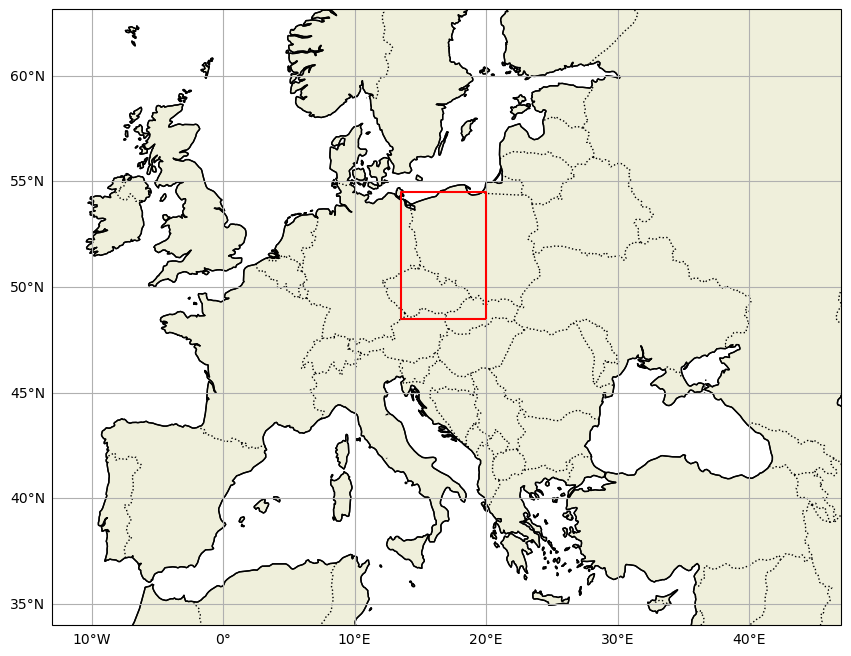

In [35]:
def basic_geo_features(ax, edgecolor="k"):
    ax.coastlines(color=edgecolor)  # add the coastlines
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(), draw_labels=True
    )  # add the longitude / latitude lines
    gl.right_labels = False  # remove latitude labels on the right
    gl.top_labels = False  # remove longitude labels on the top
    ax.add_feature(cfeature.LAND, zorder=1, edgecolor=edgecolor)  # add land mask
    ax.add_feature(cfeature.BORDERS, linestyle=":", edgecolor=edgecolor)


f = plt.figure(figsize=(15, 8))  # create a figure and define its size
ax = plt.axes(
    projection=ccrs.PlateCarree()
)  # create an ax and select the projection of the map
basic_geo_features(ax)
ax.set_extent([-13, 47, 34, 60])  # around europe

# creating the box
bbox_geom = box(extent[0], extent[1], extent[2], extent[3])
gdf_boris = gpd.GeoDataFrame(
    {"name": ["Zone Boris"]}, geometry=[bbox_geom], crs="EPSG:4326"
)
gdf_boris.boundary.plot(ax=ax, color="r")

In [37]:
ds_tp_boris = ds_tp.sel(longitude=slice(extent[0], extent[2])).sel(
    latitude=slice(extent[1], extent[3])
)
ts_tp_boris = ds_tp_boris.mean(dim=["latitude", "longitude"])
ts_tp_boris

<xarray.Dataset> Size: 368B
Dimensions:     (valid_time: 30)
Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 240B 2024-09-01 ... 2024-09-30
Data variables:
    tp          (valid_time) float32 120B 0.000232 0.0004585 ... 3.883e-05

Let's now plot the evolution of the daily precipitation over the area. Precipitations are usually represented as **barcharts**, so we'll use the `bar` function from matplotlib.

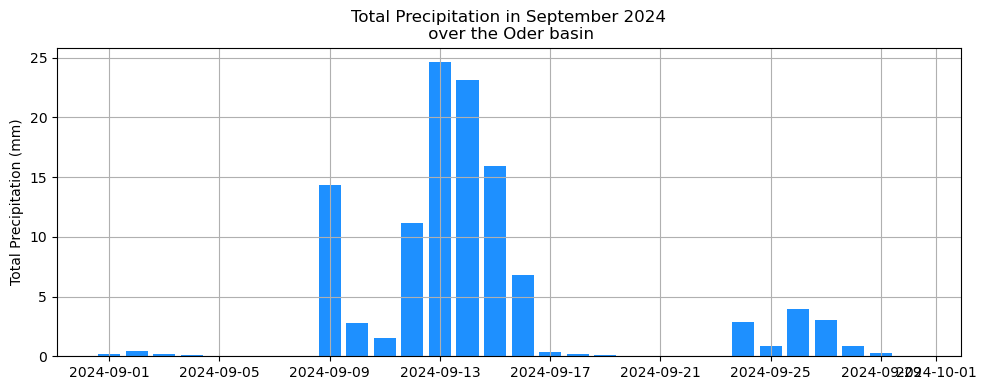

In [38]:
fig, ax = plt.subplots(figsize=(10, 4))

dates = ts_tp_boris.valid_time.data.astype(np.datetime64)
vals = ts_tp_boris.tp.data * 1000
ax.bar(dates, vals, label="daily precipitation", facecolor="dodgerblue")
ax.grid(True)
ax.set_ylabel("Total Precipitation (mm)")
ax.set_title("Total Precipitation in September 2024\n over the Oder basin")
plt.tight_layout()

The graph shows a clear "dry-to-extreme" transition, where a period of negligible rainfall is followed by a massive surge peaking on September 13th–14th with over 24 mm of average daily precipitation across the basin. This sharp peak represents the core of Storm Boris, providing the atmospheric "trigger" that we will now track as it moves through the soil and into the river network.

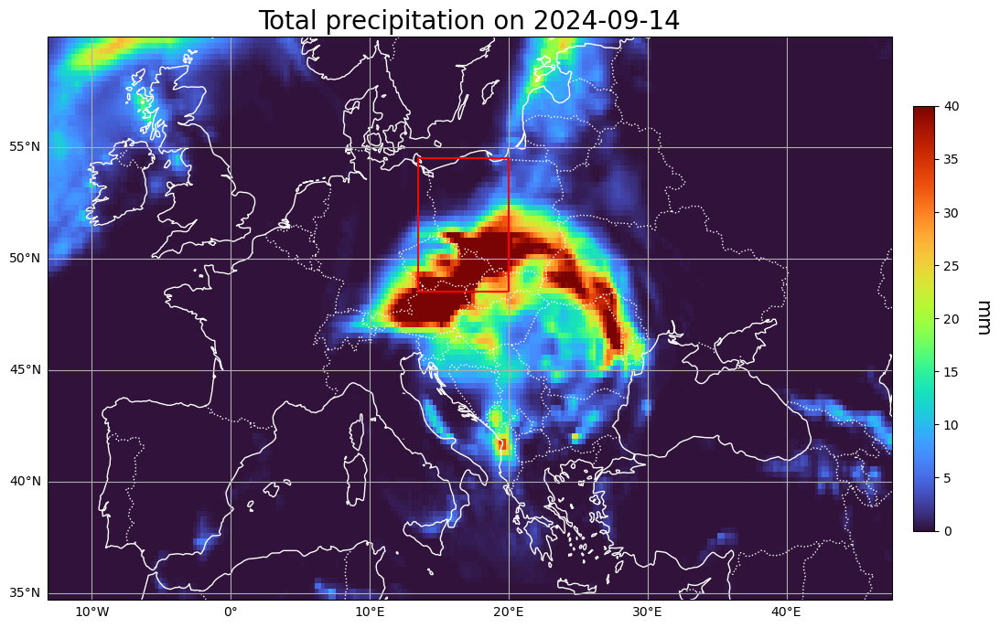

In [39]:
# select date and plot map

# Select the total precipitation parameter, at the date we want, and store it in a variable.
# Define a date that is available in the product
date_plot = "2024-09-14"
temp_map = ds_tp["tp"].sel(valid_time=date_plot, method="nearest").squeeze() * 1000

# Define the caracteristics of the plot
f = plt.figure(figsize=(15, 8))  # create a figure and define its size
ax = plt.axes(
    projection=ccrs.PlateCarree()
)  # create an ax and select the projection of the map
ax.coastlines(color="w")  # add the coastlines
gl = ax.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True
)  # add the longitude / latitude lines
gl.right_labels = False  # remove latitude labels on the right
gl.top_labels = False  # remove longitude labels on the top
ax.add_feature(cfeature.LAND, zorder=1, edgecolor="w")  # add land mask
ax.add_feature(cfeature.BORDERS, linestyle=":", edgecolor="w")

# Plot the sea surface temperature, set the min/max values of the colorbar and the colormap to use
im = ax.pcolor(
    temp_map["longitude"].data,
    temp_map["latitude"].data,
    temp_map,
    cmap="turbo",
    vmin=0,
    vmax=40,
)

gdf_boris.boundary.plot(ax=ax, color="r")
# Add the titles and legend
ax.set_title(
    "Total precipitation on {}".format(date_plot[:10]), fontsize=20, y=1
)  # add a title to the figure
cbar = f.colorbar(im, ax=ax, fraction=0.02, pad=0.02)  # add the colorbar
cbar.set_label(
    "mm", rotation=270, fontsize=15, labelpad=25
)  # add the title of the colorbar

# Save figure
# plt.savefig('out/temp_map.png')

Now that we’ve seen the "spike" in our 1D graph, it’s time to see the big picture! A static plot tells us when it rained, but an animation tells the story of the storm.

We are going to generate a dynamic map of Central Europe for the entire month of September. By animating the daily precipitation, you will be able to watch Storm Boris in action: watch it gather moisture, spiral into the heart of Europe, and - most importantly - see exactly how it became "stuck" over our study area.

In [40]:
# Preparing the figure (as previously)
fig = plt.figure(figsize=(15, 8))  # create a figure and define its size
ax = plt.axes(
    projection=ccrs.PlateCarree()
)  # create an ax and select the projection of the map
ax.coastlines(color="w")  # add the coastlines
gl = ax.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True
)  # add the longitude / latitude lines
gl.right_labels = False  # remove latitude labels on the right
gl.top_labels = False  # remove longitude labels on the top
ax.add_feature(cfeature.LAND, zorder=1, edgecolor="w")  # add land mask
ax.add_feature(cfeature.BORDERS, linestyle=":", edgecolor="w")


# Initializing the color map for the currents velocity:
im = ax.pcolormesh(
    ds_tp.longitude.data,
    ds_tp.latitude.data,
    np.zeros_like(ds_tp.tp.data[0, :, :]),
    cmap="turbo",
    vmin=0,
    vmax=50,
)
cbar = f.colorbar(im, label="mm", ax=ax, fraction=0.02, pad=0.02)  # add the colorbar
title = ax.set_title(f"Précipitations le : {ds_tp.valid_time[0].values}")
plt.close(fig)  # display only the animation

# Update function


def update(frame):
    data = ds_tp.tp.data[frame, :, :] * 1000
    im.set_array(data)  # pcolormesh attend souvent un tableau aplati

    title.set_text(
        f"Précipitations le : {np.datetime_as_string(ds_tp.valid_time[frame].values, unit='D')}"
    )
    return im, title


ani = FuncAnimation(
    fig, update, frames=len(ds_tp.valid_time.data), interval=400, blit=False
)
HTML(ani.to_jshtml())

Notice how Storm Boris doesn't just pass through; it becomes trapped over Central Europe, acting like a stationary "moisture pump" fueled by the warm Mediterranean. While basin-wide averages were significant, specific locations saw staggering totals. In parts of Czechia and Poland, 24-hour rainfall exceeded 200 mm, and three-day accumulations reached 442 mm to 500 mm.

Ready to see the consequences on the ground? Let's move to the next section to analyze how the Oder River responded!

## 6. The chronology of the flooding

[Go back to the "Table of contents"](#Table-of-contents)


In this section, we transition from ERA5 atmospheric data to the Global Flood Awareness System (GloFAS). By combining these datasets, we can track the "Domino Effect" through three critical variables:
*  Soil Water Index (SWI): This tells us how "thirsty" or saturated the ground was. We will see how the soil acts as a sponge until it reaches a breaking point.
*  Surface Runoff: Once the soil can no longer absorb the rain, the water flows over the surface. This is the immediate reaction to the storm’s intensity.
*  River Discharge: The final stage of the journey. We will observe how runoff from across the entire basin converges into the main arteries of the Oder, creating the massive flood wave that travels downstream.

To product we are going to use is [River discharge and related historical data from the Global Flood Awareness System](https://wekeo.copernicus.eu/data?view=dataset&dataset=EO:ECMWF:DAT:CEMS_GLOFAS_HISTORICAL). It is developed by the Copernicus Emergency Management Service (CEMS) and uses also ERA5 data.

| Parameter | Value |
| :---: | :---|
| **Variables used** | swir, rowe, dis24 |
| **Product identifier** |[EO:ECMWF:DAT:CEMS_GLOFAS_HISTORICAL](https://wekeo.copernicus.eu/data?view=dataset&dataset=EO:ECMWF:DAT:CEMS_GLOFAS_HISTORICAL) |
| **Temporal resolution** | Daily |
| **Spatial resolution** | 0.05° x 0.05° |
| **Temporal coverage** | Jan 1979 - Present |


<center>
    <img src="img/glofas_thb.png" width="300">
</center>

Let's download the data. In order to ensure the downloading process succeeds, we will perform one request for each variable. The data request files are located in the `data` directory.

In [ ]:
# retrieve SWI

with open("./data/req_swi.json", "r") as f:
    data = json.load(f)
print(data)

### Retrieve data
## Path to local data storage
output_path = "data"

## Run the search with query
matches = c.search(data)

## Print results
print(matches)

matches.download(output_path)

In [ ]:
# retrieve runoff

with open("./data/req_runoff.json", "r") as f:
    data = json.load(f)
print(data)

### Retrieve data
## Path to local data storage
output_path = "data"

## Run the search with query
matches = c.search(data)

## Print results
print(matches)

matches.download(output_path)

In [ ]:
# retrieve river discharge

with open("./data/req_dis.json", "r") as f:
    data = json.load(f)
print(data)

### Retrieve data
## Path to local data storage
output_path = "data"

## Run the search with query
matches = c.search(data)

## Print results
print(matches)

matches.download(output_path)

{'dataset_id': 'EO:ECMWF:DAT:CEMS_GLOFAS_HISTORICAL', 'system_version': ['version_4_0'], 'hydrological_model': ['lisflood'], 'product_type': ['consolidated'], 'variable': ['river_discharge_in_the_last_24_hours'], 'hyear': ['2024'], 'hmonth': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12'], 'hday': ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31'], 'data_format': 'netcdf', 'download_format': 'unarchived', 'bbox': [13.5, 48.5, 20, 54.5], 'itemsPerPage': 200, 'startIndex': 0}
SearchResults[items=1,volume=ND]


Let's now load all this data !

In [41]:
# loading SWI
ds_swi = xr.open_dataset(
    "data/cems-glofas-historical-8cd5a4906915e4f26c97ce08a1227163.nc"
)
ds_swi = ds_swi.sortby("latitude")

# loading River Discharge
ds_dis = xr.open_dataset(
    "data/cems-glofas-historical-518fff0623adffe6edf5a552d0e358be.nc"
)
ds_dis = ds_dis.sortby("latitude")

# loading runoff
ds_run = xr.open_dataset(
    "data/cems-glofas-historical-d60b21f6248c4ada57b8e8cd4737d3e5.nc"
)
ds_run = ds_run.sortby("latitude")

### 6.1 First look at the Soil Water Index data

[Go back to the "Table of contents"](#Table-of-contents)

We will now compute the Soil Water Index anomaly and compare it before and after the storm. The anomaly is computed by calculating the average SWI over the entire year, and subtracting this reference to the SWI dataset:

In [43]:
ds_swi_avg = ds_swi.mean(dim="valid_time")
ds_swi_anom = 100 * (ds_swi - ds_swi_avg) / ds_swi_avg
ds_swi_anom

<xarray.Dataset> Size: 23MB
Dimensions:     (valid_time: 366, latitude: 120, longitude: 130)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 3kB 2024-01-02 ... 2025-01-01
    rootZone    float64 8B 0.0
  * latitude    (latitude) float64 960B 48.52 48.58 48.63 ... 54.38 54.43 54.48
  * longitude   (longitude) float64 1kB 13.53 13.58 13.63 ... 19.88 19.93 19.98
Data variables:
    swir        (valid_time, latitude, longitude) float32 23MB 17.39 ... 6.342

We can now plot two anomaly maps side by side, on before and one after the storm.

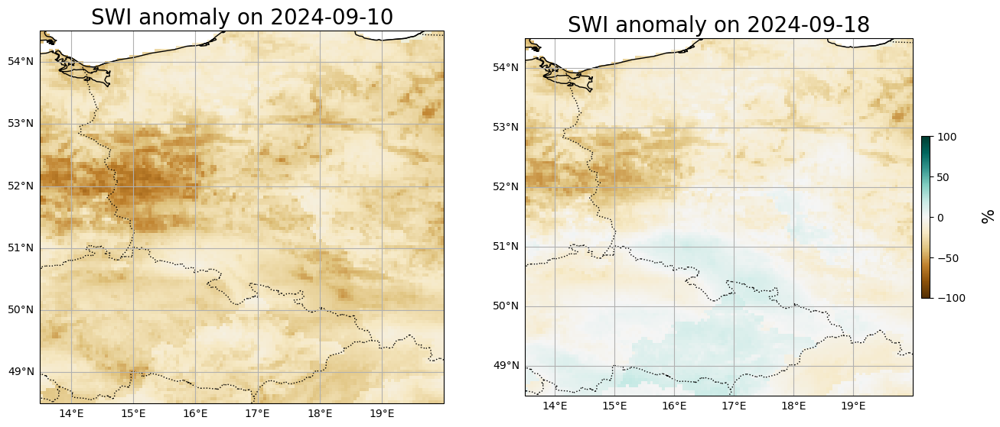

In [44]:
# Select the total precipitation parameter, at the date we want, and store it in a variable.
# Define a date that is available in the product

date_plot1 = "2024-09-10"
date_plot2 = "2024-09-18"
temp_map1 = ds_swi_anom["swir"].sel(valid_time=date_plot1, method="nearest").squeeze()
temp_map2 = ds_swi_anom["swir"].sel(valid_time=date_plot2, method="nearest").squeeze()

# Define the caracteristics of the plot
f = plt.figure(figsize=(15, 8))  # create a figure and define its size
ax1 = plt.subplot(
    121, projection=ccrs.PlateCarree()
)  # create an ax and select the projection of the map
basic_geo_features(ax=ax1, edgecolor="k")
# Plot the sea surface temperature, set the min/max values of the colorbar and the colormap to use
im = ax1.pcolor(
    temp_map1["longitude"].data,
    temp_map1["latitude"].data,
    temp_map1,
    cmap="BrBG",
    vmin=-100,
    vmax=100,
)
ax1.set_title("SWI anomaly on {}".format(date_plot1[:10]), fontsize=20, y=1)

ax2 = plt.subplot(
    122, projection=ccrs.PlateCarree()
)  # create an ax and select the projection of the map
basic_geo_features(ax=ax2, edgecolor="k")
# Plot the sea surface temperature, set the min/max values of the colorbar and the colormap to use
im = ax2.pcolor(
    temp_map2["longitude"].data,
    temp_map2["latitude"].data,
    temp_map2,
    cmap="BrBG",
    vmin=-100,
    vmax=100,
)
ax2.set_title("SWI anomaly on {}".format(date_plot2[:10]), fontsize=20, y=1)

cbar = f.colorbar(im, ax=ax2, fraction=0.02, pad=0.02)  # add the colorbar
cbar.set_label(
    "%", rotation=270, fontsize=15, labelpad=25
)  # add the title of the colorbar

Shortly before the storm (September 10th), we can see that the soil was exceptionally dry with regards to the 2024 average, which makes sense because it was the end of the summer. After the storm, ths southern part of the basin shifted to a positive anomaly. Notice that even after the storm, large parts of the basin still show a negative SWI anomaly. This tells us that the storm was an intense runoff event rather than a soaking event. The rainfall was so violent that it bypassed the soil's storage capacity in many areas, rushing directly into the river channels—this is exactly why the river levels spiked so dangerously fast while the deeper soil remained technically 'dry' compared to historical averages. 

### 6.2 Reconstructing the timeline

[Go back to the "Table of contents"](#Table-of-contents)


To truly understand the "Domino Effect" of this disaster, we will now align our four key variables on a single chronological timeline: Precipitation, Soil Water Index, Surface Runoff, and River Discharge.

We simply do this by computing the average of each dataset over the latitude and longitude dimensions.

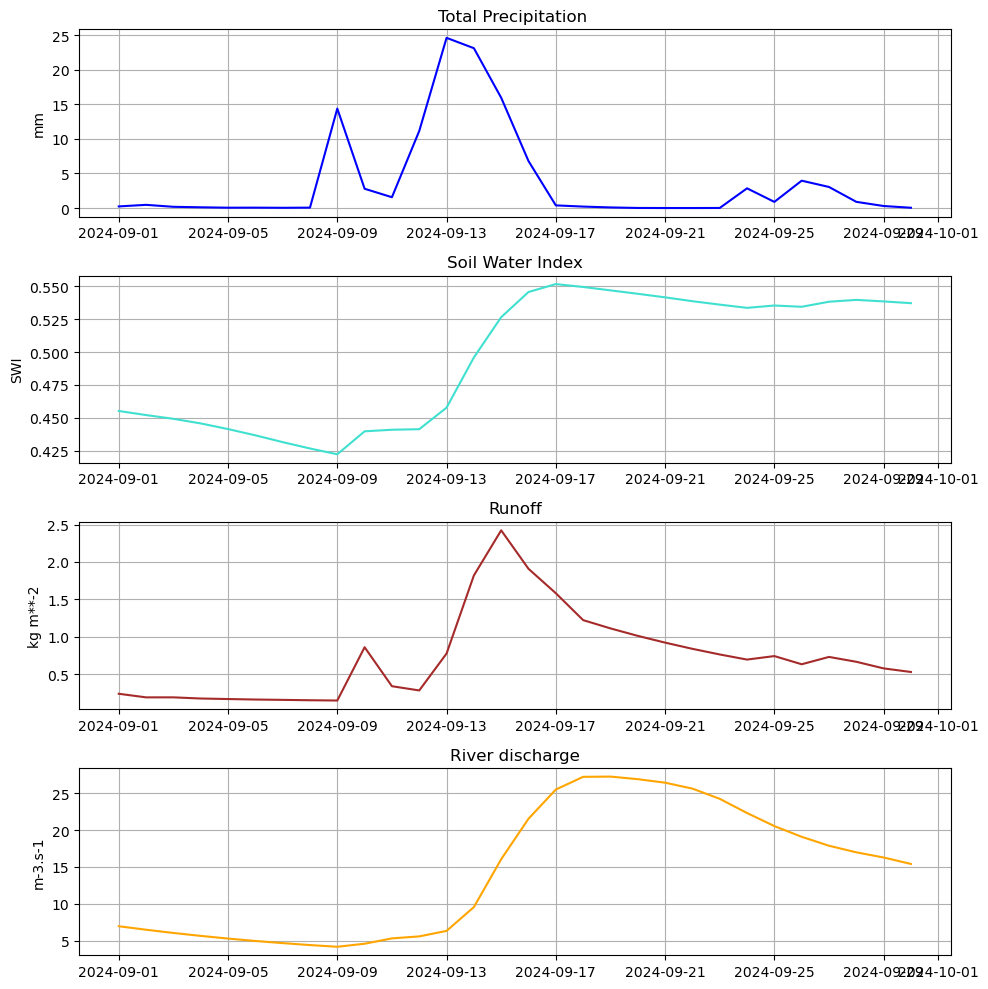

In [45]:
fig, axes = plt.subplots(4, 1, figsize=(10, 10))

dates = ts_tp_boris.valid_time.data.astype(np.datetime64)
axes[0].plot(dates, ts_tp_boris.tp.data * 1000, c="b", label="daily precipitation")
axes[0].grid(True)
axes[0].set_ylabel("mm")
axes[0].set_title("Total Precipitation ")


ts_swi = ds_swi.sel(valid_time="2024-09").mean(dim=["latitude", "longitude"])
dates = ts_swi.valid_time.data.astype(np.datetime64)

axes[1].plot(dates, ts_swi.swir.data, c="turquoise", label="SWI")
axes[1].grid(True)
axes[1].set_ylabel("SWI")
axes[1].set_title("Soil Water Index")


ts_run = ds_run.sel(valid_time="2024-09").mean(dim=["latitude", "longitude"])

axes[2].plot(dates, ts_run.rowe.data, c="brown", label="SWI")
axes[2].grid(True)
axes[2].set_ylabel("kg m**-2")
axes[2].set_title("Runoff")

ts_dis = ds_dis.sel(valid_time="2024-09").mean(dim=["latitude", "longitude"])

axes[3].plot(dates, ts_dis.dis24.data, c="orange", label="SWI")
axes[3].grid(True)
axes[3].set_ylabel("m-3.s-1")
axes[3].set_title("River discharge")


plt.tight_layout()

This four-panel visualization perfectly captures the "Domino Effect" of a hydrological disaster! By aligning these variables, we can trace the exact life cycle of Storm Boris as it moves from the atmosphere to the riverbed:
*  As soon as the violent precipitation begins, we see the Soil Water Index rise sharply. The "sponge" is desperately soaking up the moisture to compensate for the summer’s dry spell.
*  Notice that the Runoff peak occurs before the SWI reaches its maximum. It indicates the rainfall was so intense that it exceeded the soil's infiltration capacity. The ground couldn't "drink" fast enough, forcing the water to rush over the surface instead.
*  Finally, the River Discharge responds with the longest lag. This represents the time needed for every drop of surface runoff from across the Oder basin to converge into the main river arteries, culminating in the massive flood wave seen around September 18th.


<div class="alert alert-block alert-info">


<b>Exercise:</b>
    
We have plotted the GloFAS data over the month of September to closely study the Boris Storm. Can you adapt the script to plot the SWI, runoff and discharge over the entire year of 2024 ? This would how exceptionally high the three variables were with regards to the rest of the year.

</div>

<div class="alert alert-block alert-info">


<b>Exercise:</b>
    
You can also identify the flood propagation using timeseries: select two specific geographic coordinates along the Oder River: one in the southern headwaters near the Czech border and one further north near the estuary. Plot the River Discharge (m3/s) for both locations on the same graph for the month of September. Can you spot a delay between the two river discharge surges?

</div>

## 7. Animating the flood

[Go back to the "Table of contents"](#Table-of-contents)


To wrap up this spatial analysis, we are going to create a dual animation of Surface Runoff and River Discharge.

While runoff occurs everywhere across the land, the river discharge only happens within the drainage network. To make the Oder River truly stand out, we will use a specialized "Upstream Area" dataset. This allows us to mask out the noise and highlight only the main river arteries—the veins of the basin where the water actually accumulates.

### 7.1 Filtering the data with the upstream area

[Go back to the "Table of contents"](#Table-of-contents)


We have downloaded the Upstream Area directly from the [Copernicus Data Store](https://confluence.ecmwf.int/display/CEMS/Auxiliary+Data), this dataset is directly related to our GloFAS dataset. The upstream area file denotes the total upstream area for each river pixel, expressed in m2. It is defined as the catchment area for each river segment, i.e. the total area that contributes with water to the river at the specific grid point (or river pixel). The upstream area always includes the area of the pixel it is associated to.

👉 In our study, Upstream Area acts as a filter, allowing us to clearly visualize the main arteries of the Oder River as they carry the flood wave downstream.

In [46]:
ds_ua = xr.open_dataset("data/uparea_glofas_v4_0_oder.nc")
ds_ua

<xarray.Dataset> Size: 64kB
Dimensions:    (longitude: 130, latitude: 120)
Coordinates:
  * longitude  (longitude) float64 1kB 13.52 13.57 13.62 ... 19.88 19.92 19.97
  * latitude   (latitude) float64 960B 48.52 48.57 48.62 ... 54.38 54.42 54.47
Data variables:
    uparea     (latitude, longitude) float32 62kB ...
Attributes:
    CDI:                        Climate Data Interface version 1.9.10 (https:...
    Conventions:                CF-1.9
    GDAL_PCRASTER_VALUESCALE:   VS_SCALAR
    GDAL_AREA_OR_POINT:         Area
    GDAL:                       GDAL 3.2.1, released 2020/12/29
    NCO:                        netCDF Operators version 4.9.7 (Homepage = ht...
    history_of_appended_files:  Fri Dec 10 11:49:42 2021: Appended file ldd_O...
    history:                    Mon Nov 14 17:49:16 2022: cdo chname,lon,long...
    CDO:                        Climate Data Operators version 1.9.10 (https:...

Let's visualize the river discharge with and without the upstream area dataset, on a random date:

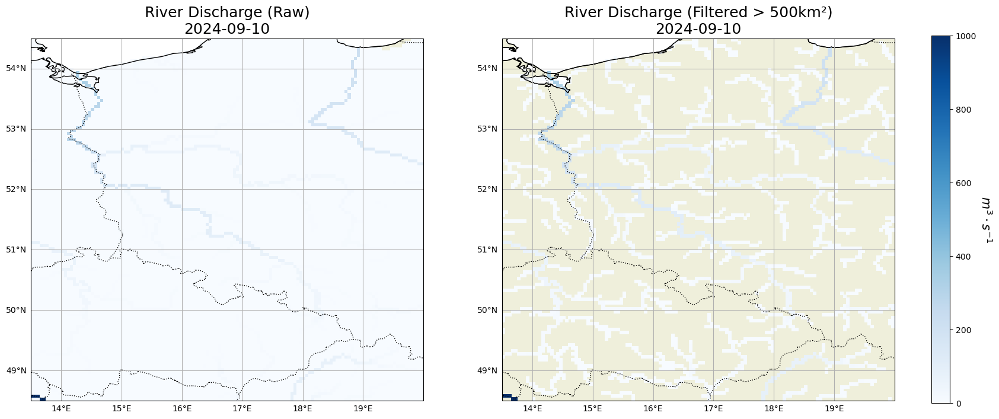

In [47]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import numpy as np

date_plot = "2024-09-10"
ds_dis_map = ds_dis.sel(valid_time=date_plot)

# Only pixels upstream area > 500 km2 are kept
temp_map_filtered = np.where(ds_ua.uparea.data > 500 * 1e6, ds_dis_map.dis24, np.nan)

f, (ax1, ax2) = plt.subplots(
    1, 2, figsize=(20, 10), subplot_kw={"projection": ccrs.PlateCarree()}
)

# --- Without Upstream Area filtering ---
basic_geo_features(ax=ax1, edgecolor="k")
im1 = ax1.pcolor(
    ds_dis_map["longitude"].data,
    ds_dis_map["latitude"].data,
    ds_dis_map.dis24,  # Donnée brute
    cmap="Blues",
    vmin=0,
    vmax=1000,
)
ax1.set_title(f"River Discharge (Raw)\n{date_plot}", fontsize=18)

# --- With Upstream Area filtering ---
basic_geo_features(ax=ax2, edgecolor="k")
im2 = ax2.pcolor(
    ds_dis_map["longitude"].data,
    ds_dis_map["latitude"].data,
    temp_map_filtered,  # Donnée filtrée
    cmap="Blues",
    vmin=0,
    vmax=1000,
)
ax2.set_title(f"River Discharge (Filtered > 500km²)\n{date_plot}", fontsize=18)

# Ajout d'une barre de couleur commune
cbar = f.colorbar(im2, ax=[ax1, ax2], fraction=0.02, pad=0.04)
cbar.set_label("$m^3 \cdot s^{-1}$", rotation=270, labelpad=20, fontsize=15)

plt.show()

Here we filtered the river discharge dataset by removing the pixels that only have a small geographical area flowing into them. By setting a threshold on the upstream area, we effectively **remove the noise of small streams and surface runoff** from the river discharge dataset. This allows us to highlight only the pixels belonging to the main river channels.

We can now clearly distinguish the arteries of the Oder river !

### 7.2 Creating the final animation

[Go back to the "Table of contents"](#Table-of-contents)


To complete our spatial analysis, we are layering two distinct data products to visualize the disaster's progression. This dual-layer approach allows us to see both the cause (local runoff) and the effect (river flooding) in a single view.

Reminder of the quantities shown:
*  The surface runoff (background): Shown in orange tones, this layer represents where water "originates" on the land surface due to intense rainfall.
*  The river discharge (arteries): Shown in blue tones, this layer represents the accumulation of that water as it travels through the river network, filtered by the Upstream Area dataset.

We are going to set a animation with 1 frame per day. In order to cover the entire storm, from the early signs to the aftermath, we will be subsetting the data from the 1st of September to the 10th of October 2024.

In [48]:
# --- Data subsetting ---
ds_dis_sliced = ds_dis.sel(valid_time=slice("2024-09-01", "2024-10-10"))
ds_run_sliced = ds_run.sel(valid_time=slice("2024-09-01", "2024-10-10"))

In [50]:
# setting up variables and constants
threshold = 500 * 1e6  # upstream area filtering
times = ds_dis_sliced.valid_time.data
lons = ds_dis_sliced.longitude.data
lats = ds_dis_sliced.latitude.data

v_min, v_max = 1, 1000
v_min_run, v_max_run = 5, 40

In [51]:
# Figure Setup
fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([extent[0], extent[2], extent[1], extent[3]])
basic_geo_features(ax=ax, edgecolor="k")


def get_flood_maps(index):
    dis_data = ds_dis_sliced.dis24.isel(valid_time=index).data
    run_data = ds_run_sliced.rowe.isel(valid_time=index).data
    river_layer = np.where(ds_ua.uparea.data > threshold, dis_data, np.nan)
    runoff_layer = np.where(run_data > 0, run_data, np.nan)
    return river_layer, runoff_layer


# Initial Plot with pcolormesh
# We use pcolormesh because pcolor is extremely slow for animations
init_river, init_run = get_flood_maps(0)

im_run = ax.pcolormesh(
    lons,
    lats,
    init_run,
    cmap="Oranges",
    alpha=0.6,
    zorder=1,
    vmin=v_min_run,
    vmax=v_max_run,
    shading="auto",
    transform=ccrs.PlateCarree(),
)

im_dis = ax.pcolormesh(
    lons,
    lats,
    init_river,
    cmap="Blues",
    zorder=2,
    vmin=v_min,
    vmax=v_max,
    shading="auto",
    transform=ccrs.PlateCarree(),
)

cbar_dis = fig.colorbar(im_dis, ax=ax, fraction=0.03, pad=0.02)
cbar_dis.set_label("River Discharge ($m^3/s$)")

cbar_run = fig.colorbar(
    im_run, ax=ax, fraction=0.03, pad=0.08, orientation="horizontal"
)
cbar_run.set_label("Surface Runoff ($kg/m^2$)")

title = ax.set_title("", fontsize=16, fontweight="bold")

# Animation Function


def animate(i):
    current_time = times[i]
    river_data, runoff_data = get_flood_maps(i)

    # Update the data arrays
    # .set_array expects a 1D array for pcolormesh in many matplotlib versions
    im_run.set_array(runoff_data.ravel())
    im_dis.set_array(river_data.ravel())

    title.set_text(
        f'Storm Boris Hydrological Pulse\nDate: {np.datetime_as_string(current_time, unit="D")}'
    )
    return im_run, im_dis, title


# blit=True works with set_array
ani = animation.FuncAnimation(fig, animate, frames=len(times), interval=150, blit=True)
plt.close()

In [52]:
HTML(ani.to_jshtml())

The animation provides a compelling look at the spatiotemporal progression of the flood event, illustrating the direct causal link between intense atmospheric precipitation and the resulting terrestrial flood wave. The sequence begins between September 12th and 14th, where we observe a massive surge in surface runoff, concentrated primarily in the high-elevation catchments of Southern Czechia and Southwestern Poland (we can see dark orange hues appearing in the South).

Then we can clearly visualize the downstream propagation, as this runoff enters the drainage network. We see the river discharge immediately spike into deep blue shades as the accumulated volume hits the main stem of the Oder River. This "hydrological pulse" moves northward with significant velocity, demonstrating how local rainfall in the mountains transforms into a regional threat as the crest travels toward the Baltic estuary. In the final days of the sequence, the animation shows the gradual attenuation of the event: the river discharge remains elevated but steadily decreases, marking the transition from the peak crisis to the slow drainage of the basin.

<div class="alert alert-block alert-info">


<b>Exercise:</b>
    
Could you perform a similar analysis on another major historical storm to compare the runoff-to-discharge lag times? Here are three examples of comparable events that could offer a great comparison to the dynamics of Storm Boris:
*  **Storm Bernd (July 2021) – Western Germany & Belgium**
*  **Storm Daniel (September 2023) – Thessaly, Greece**
*  **The June 2013 European Floods – Danube & Elbe Basins**



</div>

## 8. Take home messages

[Go back to the "Table of contents"](#Table-of-contents)

In this tutorial, you’ve successfully built a complete data pipeline to analyze the impact of Storm Boris using Python and Copernicus data. Using `xarray` for spatiotemporal analysis, you’ve transformed raw NetCDF files into a clear visualization of how extreme rainfall triggers a downstream flood wave. You now have a robust, reusable toolkit to investigate climate extremes and hydrological risks anywhere in the world.


<div class="alert alert-block alert-success">
    <b>Congratulations !!</b><br>

And thank you for your attention! :) 
    
    
We hope you enjoyed this Jupyter Notebook training.

You now have plenty of tools to study extreme precipitation events and flooding. Feel free to re-use and adapt all the Python scripts of this notebook to your needs! 

This training course is over but we'd love to hear from you about how we could improve it (topics, tools, storytelling, format, speed etc). If you have any questions, do not hesitate to contact us using our [**live chat widget**](https://www.wekeo.eu/support) or by email at [support@wekeo.eu](support@wekeo.eu) !

Credit: This notebook was developed by [NOVELTIS](https://www.noveltis.fr/) under Contract No. 25335-COP-CAPACITY-DEV-8000 with Mercator Ocean.

## Additional Information
---

#### Compatible Data Science Toolkits

In [ ]:
import pkg_resources

pkg_resources.get_distribution("hda").version

In [ ]:
import xarray

print(xarray.__version__)

#### Last Modified and Tested

In [ ]:
from datetime import date

print(date.today())

<img src='https://github.com/wekeo/ai4EM_MOOC/raw/04147f290cfdcce341f819eab7ad037b95f25600/img/ai4eo_logos.jpg' alt='Logo EU Copernicus WEkEO' align='center' width='100%'></img>

[View on GitHub](https://github.com/wekeo) | 
[Visit WEkEO](https://wekeo.coperncius.eu) | [Run Notebooks on the WEkEO Workspace](https://jupyterhub.prod.wekeo2.eu/) | 
[Contact helpdesk for support](mailto:support@wekeo.eu)
